In [26]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import torch
import sklearn
import os
import json
import catboost
import itertools
import time
import yaml
from jinja2 import Environment, FileSystemLoader
import kubernetes as kn
import itertools
import random

from sklearn.model_selection import train_test_split

In [28]:
data = xr.open_dataset('/home/jovyan/work/ship/calculate_points/geo_results/250/geo_em.d01.nc')

In [4]:
print(",".join([key for key in data.data_vars.keys()]))

Times,XLAT_M,XLONG_M,XLAT_V,XLONG_V,XLAT_U,XLONG_U,CLAT,CLONG,MAPFAC_M,MAPFAC_V,MAPFAC_U,MAPFAC_MX,MAPFAC_VX,MAPFAC_UX,MAPFAC_MY,MAPFAC_VY,MAPFAC_UY,E,F,SINALPHA,COSALPHA,LANDMASK,XLAT_C,XLONG_C,SINALPHA_U,COSALPHA_U,SINALPHA_V,COSALPHA_V,LANDUSEF,LU_INDEX,HGT_M,SOILTEMP,SOILCTOP,SCT_DOM,SOILCBOT,SCB_DOM,ALBEDO12M,GREENFRAC,LAI12M,SNOALB,CON,VAR,OA1,OA2,OA3,OA4,OL1,OL2,OL3,OL4,VAR_SSO


In [44]:
set(data["SCT_DOM"].to_numpy().reshape(-1))

{14.0}

In [213]:
def get_layers_pd(xr_file, field_name, res):
    data = xr_file[field_name].to_dataframe()
    data = data.reset_index()
    data = data.drop(columns=['Time'])

    def process_frame(fr, save_base_field_name, field_name_from):
        print("process_frame", save_base_field_name, field_name_from)
        nonlocal res

        for ind, row in fr.iterrows():
            west_east = round(row["west_east"])
            south_north = round(row["south_north"])
            save_field_name = f"{save_base_field_name}_{west_east}_{south_north}"
            res[save_field_name] = [row[field_name_from]]

    process_frame(data, field_name, field_name)


def make_raw_feats_from_geodata_pd(xr_file, id):
    res = {}
    res["id"] = id
    def process_layers(field_name):
        nonlocal res
        get_layers_pd(xr_file, field_name, res)

    for i in range(1, 5):
        process_layers(f"OL{i}")
        process_layers(f"OA{i}")

    # SINALPHA_V,COSALPHA_V
    # SINALPHA_U,COSALPHA_U
    # SINALPHA,COSALPHA
    # XLAT_M,XLONG_M,XLAT_V,XLONG_V,XLAT_U,XLONG_U, CLAT, CLONG
    # FACMAPFAC_M,MAPFAC_V,MAPFAC_U,MAPFAC_MX,MAPFAC_VX,MAPFAC_UX,MAP_MY,MAPFAC_VY,MAPFAC_UY, E,F
    # XLAT_C,XLONG_C

    process_layers("LANDMASK")
    process_layers("HGT_M")
    process_layers("SOILTEMP")
    process_layers("SNOALB")
    process_layers("VAR")
    process_layers("CON")
    process_layers("VAR_SSO")

    res = pd.DataFrame(res)

    return res

In [215]:
import logging

logging.basicConfig(
    format='%(asctime)s %(levelname)-8s %(message)s',
    level=logging.DEBUG,
    datefmt='%Y-%m-%d %H:%M:%S',
    filename=f'script_ml_train.log',
    encoding='utf-8',
)

In [216]:
def process_feats_pd(start_ind, end_ind, middle_mode=False):
    local_res = pd.DataFrame()
    for i in range(start_ind, end_ind):
        data = xr.open_dataset(f'/home/jovyan/work/ship/calculate_points/{ "geo_results_middle" if middle_mode else "geo_results" }/{i}/geo_em.d01.nc')
        geo_feats = make_raw_feats_from_geodata_pd(data, i)
        local_res = pd.concat([local_res, geo_feats])
        print(f"{i} processed")
        logging.info(f"{i} processed")
    return local_res

In [3]:
pair_indices = [
    #(0, 5640)
]

frames = []

for pair_ind, pair in enumerate(pair_indices):
    frames.append(process_feats_pd(*pair, middle_mode=True))

pd.concat(frames).to_csv('/home/jovyan/work/ship/calculate_points/middle_geo_small_feats.csv')
del frames

NameError: name 'pd' is not defined

In [374]:
feats = pd.read_csv('/home/jovyan/work/ship/calculate_points/middle_geo_small_feats.csv', nrows=1)

In [7]:
column_prefixes = ["LANDMASK", "HGT_M", "SOILTEMP", "SNOALB", "VAR", "CON", "VAR_SSO"]
for i in range(1, 5):
    column_prefixes.append(f"OL{i}")
    column_prefixes.append(f"OA{i}")

print(len(column_prefixes))

15


In [8]:
dtype_ = {'id': np.int64}

for i in range(99):
    for j in range(99):
        for column_prefix in column_prefixes:
            dtype_[f"{column_prefix}_{i}_{j}"] = np.float32

In [ ]:
feats = pd.read_csv('/home/jovyan/work/ship/calculate_points/middle_geo_small_feats.csv', dtype=dtype_, usecols=list(dtype_.keys()))

In [ ]:
[i for i in list(feats.columns) if i[:2] == "SO"]

In [29]:
def print_stats(feats):
    min_max_storage = {}

    for column in sorted(feats.columns):
        tokens = column.split("_")
        column_name = "_".join(tokens[:-2])

        column_data = feats[column]
        cur_min_val, cur_max_val = min_max_storage.get(column_name, (1000000, -1000000))
        cur_min_val = min(column_data.min(),  cur_min_val)
        cur_max_val = max(column_data.max(),  cur_max_val)

        min_max_storage[column_name] = (cur_min_val, cur_max_val)

    for column in min_max_storage:
        min_val, max_val = min_max_storage[column]
        print(f"{column} {min_val} {max_val}")

In [12]:
print_stats(feats)

CON 0.0 120.3625030517578
HGT_M -186.612548828125 6326.7001953125
LANDMASK 0.0 1.0
OA1 -1.0 0.8922999501228333
OA2 -1.0 0.8960749506950378
OA3 -1.0 0.675000011920929
OA4 -0.8863499760627747 0.623449981212616
OL1 0.0 1.0
OL2 0.0 1.0
OL3 0.0 1.0
OL4 0.0 1.0
SCB_DOM 1.0 16.0
SCT_DOM 1.0 16.0
SNOALB 0.0 84.0
SOILTEMP 0.0 304.77117919921875
 0 502
VAR 0.0 885.6799926757812
VAR_SSO 0.0 1001987.375


In [13]:
normilized_feats = feats #feats.copy()

In [14]:
normilized_feats

,Unnamed: 0,id,OL1_0_0,OL1_1_0,OL1_2_0,OL1_3_0,OL1_4_0,OL1_5_0,OL1_6_0,OL1_7_0,...,SCB_DOM_89_98,SCB_DOM_90_98,SCB_DOM_91_98,SCB_DOM_92_98,SCB_DOM_93_98,SCB_DOM_94_98,SCB_DOM_95_98,SCB_DOM_96_98,SCB_DOM_97_98,SCB_DOM_98_98
0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0
1,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0
2,0,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0
3,0,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0
4,0,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,0,498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,...,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
462,0,499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,4.0,4.0,4.0,4.0,6.0,6.0,4.0,4.0,6.0
463,0,500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,4.0,4.0,4.0,4.0,6.0,6.0,6.0,6.0,6.0
464,0,501,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,6.0,6.0,6.0,6.0,6.0,6.0,4.0,4.0,4.0


In [15]:
def preprocess_feats(frame):
    print("preprocess called")

    def transform_and_ret_scaler(column_name):
        print("transform called")
        column_feats = []

        for i in range(99):
            for j in range(99):
                full_column_name = f"{column_name}_{i}_{j}"
                column_feats = np.append(column_feats, [frame[full_column_name]])

        column_feats = column_feats.reshape((len(column_feats), 1))
        print(f"feats shape {column_feats.shape}")

        scaler = sklearn.preprocessing.MinMaxScaler().fit(column_feats)
        print("fit returned")

        for i in range(99):
            for j in range(99):
                full_column_name = f"{column_name}_{i}_{j}"
                feats = frame[full_column_name]
                feats = feats.to_numpy().reshape((len(feats), 1))
                frame[full_column_name] = scaler.transform(feats).reshape((len(feats)))

        print("scaler returned")
        return scaler

    return {
        "CON": transform_and_ret_scaler("CON"),
        "HGT_M": transform_and_ret_scaler("HGT_M"),
        "OA1": transform_and_ret_scaler("OA1"),
        "OA2": transform_and_ret_scaler("OA2"),
        "OA3": transform_and_ret_scaler("OA3"),
        "OA4": transform_and_ret_scaler("OA4"),
        "SNOALB": transform_and_ret_scaler("SNOALB"),
        "SOILTEMP": transform_and_ret_scaler("SOILTEMP"),
        "VAR_SSO": transform_and_ret_scaler("VAR_SSO"),
        "VAR": transform_and_ret_scaler("VAR"),
    }


In [16]:
scalers = preprocess_feats(normilized_feats)
normilized_feats

preprocess called
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned
transform called
feats shape (4567266, 1)
fit returned
scaler returned


,Unnamed: 0,id,OL1_0_0,OL1_1_0,OL1_2_0,OL1_3_0,OL1_4_0,OL1_5_0,OL1_6_0,OL1_7_0,...,VAR_SSO_89_98,VAR_SSO_90_98,VAR_SSO_91_98,VAR_SSO_92_98,VAR_SSO_93_98,VAR_SSO_94_98,VAR_SSO_95_98,VAR_SSO_96_98,VAR_SSO_97_98,VAR_SSO_98_98
0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,0,498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
462,0,499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
463,0,500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
464,0,501,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
print_stats(normilized_feats)

CON 0.0 1.0
HGT_M 0.0 1.0
LANDMASK 0.0 1.0
OA1 0.0 1.0
OA2 0.0 1.0
OA3 0.0 1.0
OA4 0.0 1.0
OL1 0.0 1.0
OL2 0.0 1.0
OL3 0.0 1.0
OL4 0.0 1.0
SNOALB 0.0 1.0
SOILTEMP 0.0 1.0
 0 502
VAR 0.0 0.9999999999999999
VAR_SSO 0.0 1.0


In [18]:
feats_train, feats_validation = train_test_split(normilized_feats, train_size=0.8, random_state=93, shuffle=True)
del normilized_feats
del feats

In [218]:
def make_np_layers_from_pd(frame):
    layers = [f"OL{i}" for i in range(1, 5)] + [f"OA{i}" for i in range(1, 5)]
    layers += ["LANDMASK", "HGT_M", "SOILTEMP", "SNOALB", "VAR", "CON", "VAR_SSO"]
    res = np.zeros((len(frame), len(layers), 99, 99))

    current_elem_ind = 0
    for row_ind, row in frame.iterrows():
        print(f"{current_elem_ind} processing")
        for layer_num, layer in enumerate(layers):
            print(f"{layer} processing")
            for west_east in range(99):
                for south_north in range(99):
                    res[current_elem_ind][layer_num][west_east][south_north] = row[f"{layer}_{west_east}_{south_north}"]
        current_elem_ind += 1
    return res

In [20]:
feats_train_np = make_np_layers_from_pd(feats_train)
feats_validation_np = make_np_layers_from_pd(feats_validation)

0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
1 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
2 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
3 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON pr

In [37]:
#feats_train_np = np.transpose(feats_train_np, (0, 3, 1, 2))
feats_validation_np = np.transpose(feats_validation_np, (0, 3, 1, 2))

In [450]:
feats_train_np.shape

(372, 15, 99, 99)

In [31]:
import torch
import torch.nn as nn

class Autoencoder(nn.Module):
    def __init__(self, input_shape):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                in_channels=input_shape[0], out_channels=15, kernel_size=3
            ),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2),

            nn.Conv2d(
                in_channels=15, out_channels=12, kernel_size=3
            ),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2),

            nn.Conv2d(
                in_channels=12, out_channels=9, kernel_size=3
            ),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2),

            nn.Conv2d(
                in_channels=9, out_channels=6, kernel_size=3
            ),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2),

            nn.Flatten(),
        )
        self.encoder = self.encoder.float()

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (6, 3, 3)),
            nn.ConvTranspose2d(in_channels=6, out_channels=9, kernel_size=3),
            nn.Upsample(size=(10, 10)),
            nn.ConvTranspose2d(in_channels=9, out_channels=12, kernel_size=3),
            nn.Upsample(size=(24, 24)),
            nn.ConvTranspose2d(in_channels=12, out_channels=15, kernel_size=3),
            nn.Upsample(size=(52, 52)),
            nn.ConvTranspose2d(in_channels=15, out_channels=15, kernel_size=3),
            nn.Upsample(size=(99, 99)),
        )
        self.decoder = self.decoder.float()

    def forward(self, features):
        emb = self.encoder(features)
        reconstructed = self.decoder(emb)
        if reconstructed.shape != features.shape:
            print(reconstructed.shape)
            print(features.shape)
            assert False
        return reconstructed

In [452]:
np.save('/home/jovyan/work/ship/calculate_points/emb_feats_train_normilized', feats_train_np)
np.save('/home/jovyan/work/ship/calculate_points/emb_feats_valid_normilized', feats_validation_np)

In [40]:
device = torch.device("cpu")#torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = Autoencoder(
    input_shape=(15, 99, 99) #feats_train_np[0].shape
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

criterion = nn.MSELoss()

In [41]:
model.load_state_dict(torch.load('/home/jovyan/work/ship/calculate_points/emb_middle_model_params.pt', map_location=torch.device('cpu')))
_ = model.eval()

In [118]:
!/opt/conda/bin/pip3 install torchviz

from torchviz import make_dot

make_dot(yhat, params=dict(list(model.named_parameters()))).render("torchviz", format="png")

  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4150 sha256=81b1a5b4053bbc2ad7b33718f5590ab3519cb3b3f40a7711d3fbedf533ee20bc
  Stored in directory: /home/jovyan/.cache/pip/wheels/29/65/6e/db2515eb1dc760fecd36b40d54df65c1e18534013f1c037e2e
Successfully built torchviz


NameError: name 'yhat' is not defined

In [454]:
train_loader = torch.utils.data.DataLoader(
    feats_train_np, batch_size=16, shuffle=False
)

test_loader = torch.utils.data.DataLoader(
    feats_validation_np, batch_size=16, shuffle=False)

In [455]:
total_param_cnt = 0
for p in model.parameters():
    elems_count = np.prod(p.detach().data.shape)
    total_param_cnt += elems_count

print(f"Total params cnt is {total_param_cnt}")

Total params cnt is 10299


In [474]:
epochs = 1000
for epoch in range(epochs):
    def count_weight_norm(gradients=False):
        model_weigth_norm = 0
        for p in model.parameters():
            params = p.grad.detach().data if gradients else p.detach().data
            elems_count = np.prod(params.shape)
            param_norm = params.norm(2)
            model_weigth_norm += (param_norm.item() ** 2) / elems_count
        return model_weigth_norm ** (1. / 2)

    print(f"Model weigth norm when epoch start: {count_weight_norm()}")

    _ = model.train()
    train_loss = 0
    for batch_features in train_loader:
        batch_features = batch_features.float().to(device)
        optimizer.zero_grad()
        outputs = model(batch_features)
        loss = criterion(outputs, batch_features)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    train_loss = train_loss / len(train_loader)

    _ = model.eval()
    test_loss = 0
    for batch_features in test_loader:
        batch_features = batch_features.float().to(device)
        outputs = model(batch_features)
        test_loss += criterion(outputs, batch_features).item()
    test_loss = test_loss / len(test_loader)

    grad_norm = count_weight_norm(gradients=True)

    test_losses.append(test_loss)
    train_losses.append(train_loss)

    draw_curve(epoch)

    print("epoch : {}/{}, train_loss = {:.6f}, test_loss = {:.6f}, grad_norm = {:.6f}".format(epoch + 1, epochs, train_loss, test_loss, grad_norm))

with open('calculate_points/losses.json', 'w') as outfile:
    json.dump({"train_loss": train_losses, "test_loss": test_losses}, outfile)
torch.save(model.state_dict(), 'calculate_points/emb_model_params.pt')

Model weigth norm when epoch start: 0.23482308146744346


FileNotFoundError: [Errno 2] No such file or directory: 'calculate_points/losses.jpg'

In [457]:
loss

0.8714546486735344

In [ ]:
np.array([])

In [110]:
def check_restrictions(model_params):
    if model_params["BL_PBL_PHYSICS"] == 5:
        if model_params["SF_SFCLAY_PHYSICS"] not in [1, 5]:
            return False
    elif model_params["BL_PBL_PHYSICS"] == 7:
        if model_params["SF_SFCLAY_PHYSICS"] not in [1, 7]:
            return False
    elif model_params["BL_PBL_PHYSICS"] == 10:
        if model_params["SF_SFCLAY_PHYSICS"] not in [10]:
            return False
    elif model_params["BL_PBL_PHYSICS"] == 11:
        if model_params["SF_SFCLAY_PHYSICS"] not in [1]:
            return False
    return True

def get_all_params():
    available_params = {
        "MP_PHYSICS": [8, 17, 18],
        "RA_LW_PHYSICS": [4],
        "RA_SW_PHYSICS": [4, 5],
        "RADT": [6],
        "SF_SFCLAY_PHYSICS": [1, 5, 7, 10],
        "SF_SURFACE_PHYSICS": [2, 3],
        "SF_URBAN_PHYSICS": [1],
        "BL_PBL_PHYSICS": [5, 7, 10, 11],
        "CU_PHYSICS": [3, 16],
        "DIFF_6TH_OPT": [0, 2],
        "DIFF_OPT": [1, 2],
        "KM_OPT": [4],
    }

    keys = list(available_params)
    all_possible_model_params = [dict(zip(keys, values)) for values in itertools.product(*map(available_params.get, keys))]

    return [model_params for model_params in all_possible_model_params if check_restrictions(model_params)]

class JobSchedulerContext:
    def __init__(self):
        pass

    @classmethod
    def make_job_context(cls, job_id, wrf_params, local_work_dir, job_work_dir):

        kuber_job_prefix = 'calculate-geo-feats-tmp'
        results_dir_name = 'geo_tmp_calcs'

        return {
            "id": job_id,
            "kuber_job_id": f"{kuber_job_prefix}-{job_id}",
            "wrf_params": wrf_params,
            "local_dir_with_results": os.path.join(local_work_dir, results_dir_name, job_id),
            "job_dir_with_results": os.path.join(job_work_dir, results_dir_name, job_id),
            "score": None,
            "error_msg": None
        }

    @classmethod
    def get_scheduler_job_id(cls, job_context):
        return job_context["id"]

    @classmethod
    def get_kuber_job_id(cls, job_context):
        return job_context["kuber_job_id"]

    @classmethod
    def get_wrf_params(cls, job_context):
        return job_context["wrf_params"]

    @classmethod
    def get_local_dir_with_results(cls, job_context):
        return job_context["local_dir_with_results"]

    @classmethod
    def get_job_dir_with_results(cls, job_context):
        return job_context["job_dir_with_results"]

    @classmethod
    def get_score(cls, job_context):
        return job_context["score"]

    @classmethod
    def set_score_result(cls, job_context, score_result):
        job_context["score_result"] = score_result

    @classmethod
    def set_error_msg(cls, job_context, error_msg):
        job_context["error_msg"] = error_msg


def sleep_some_random_time(min_time = 1, max_random_addition = 2):
    sleep_time = min_time + random.randint(0, max_random_addition)
    logging.info(f"Going to sleep {sleep_time} seconds.")
    time.sleep(sleep_time)

kn.config.load_kube_config()

class GeoEmbCalculator():
    def __init__(self):
        self.local_work_dir = "/home/jovyan/work/ship/calculate_points"
        self.job_work_dir = "/share/calculate_points"
        self.current_index = self._calculate_current_index()
        self.yaml_env = Environment(
            loader=FileSystemLoader(
                os.path.join(self.local_work_dir, "templates")
            )
        )
        self.kuber_api = kn.client.BatchV1Api()

    def _calculate_current_index(self):
        ids = [int(filename) for filename in os.listdir(os.path.join(self.local_work_dir, 'geo_tmp_calcs'))]
        ids.sort()
        if not ids:
            res = 0
        else:
            res = int(ids[-1]) + 1
        print("current tmp index is ", res)
        return res

    def calculate_geo_emb(self, lat, lon):
        wrf_params = {
            "LAT": f"{lat}.00",
            "LON":  f"{lon}.00",
            "E_WE": 100,
            "E_SN": 100,
            "DX": 6000,
            "START_DATE": "2020-07-15_00:00:00",
            "END_DATE": "2020-07-15_06:00:00",
            "INTERVAL_SECONDS": "10800",
            "MP_PHYSICS": 8,
            "RA_LW_PHYSICS": 4,
            "RA_SW_PHYSICS": 4,
            "RADT": 6,
            "SF_SFCLAY_PHYSICS": 1,
            "SF_SURFACE_PHYSICS": 2,
            "SF_URBAN_PHYSICS": 1,
            "BL_PBL_PHYSICS": 5,
            "CU_PHYSICS": 3,
            "DIFF_6TH_OPT": 0,
            "DIFF_OPT": 1,
            "KM_OPT": 4,
        }
        wrf_params["TIME_STEP"] = (wrf_params["DX"] // 1000) * 5

        job_context = JobSchedulerContext.make_job_context(str(self.current_index), wrf_params, self.local_work_dir, self.job_work_dir)
        self.current_index += 1

        dir_path = JobSchedulerContext.get_local_dir_with_results(job_context)
        if not os.path.exists(dir_path):
            os.makedirs(dir_path)
        else:
            assert False

        wrf_config_template = self.yaml_env.get_template('config_template.yml')
        config_wrf = wrf_config_template.render(JobSchedulerContext.get_wrf_params(job_context))
        with open(os.path.join(JobSchedulerContext.get_local_dir_with_results(job_context), 'config.yml'), "w") as file:
            file.write(config_wrf)

        kuber_template_name = 'kuber_job_template_only_geo.yml'
        kuber_config_template = self.yaml_env.get_template(kuber_template_name)
        config_kuber = kuber_config_template.render({**{
            "JOB_ID": JobSchedulerContext.get_kuber_job_id(job_context),
            "SCRIPTS_DIR": os.path.join(self.job_work_dir, 'scripts'),
            "RESULTS_PATH": JobSchedulerContext.get_job_dir_with_results(job_context),
            "N_JOBS": 12,
            "DATA_DIR": os.path.join(self.job_work_dir, 'data'),
        }})
        with open(os.path.join(JobSchedulerContext.get_local_dir_with_results(job_context), 'kuber_job.yml'), "w") as file:
            file.write(config_kuber)

        config_path = os.path.join(JobSchedulerContext.get_local_dir_with_results(job_context), "kuber_job.yml")
        with open(config_path) as f:
            dep = yaml.safe_load(f)
            resp = self.kuber_api.create_namespaced_job(body=dep, namespace="amorozov")
            print(f"Deployment created {JobSchedulerContext.get_kuber_job_id(job_context)}. status='{resp.metadata.name}'")

        while True:
            job_id = JobSchedulerContext.get_kuber_job_id(job_context)
            api_response = self.kuber_api.read_namespaced_job_status(name=job_id, namespace="amorozov")
            #logging.info(f"Job status with id={job_id} is {api_response.status}")
            if api_response.status.succeeded is not None or api_response.status.failed is not None:
                #self._process_completed_job(job_context) ?
                return make_geo_emb_from_xr(f"{JobSchedulerContext.get_local_dir_with_results(job_context)}/geo_em.d01.nc", model)
            sleep_some_random_time() # otherwise ddos on kubernetes api?


class WrfParamsOptimizer():
    def __init__(self):
        self.regressor = None #catboost.CatBoostRegressor(loss_function='RMSE', task_type='CPU') #  learning_rate=0.4, depth=4, n_estimators=200
        self.filtered_columns = ["MP_PHYSICS",  "RA_LW_PHYSICS", "RA_SW_PHYSICS", "RADT", "SF_SFCLAY_PHYSICS", "SF_SURFACE_PHYSICS", "SF_URBAN_PHYSICS", "BL_PBL_PHYSICS", "CU_PHYSICS", "DIFF_6TH_OPT", "DIFF_OPT", "KM_OPT"]
        self.all_model_params = get_all_params()
        self.geo_emb_calc = GeoEmbCalculator()

    def fit(self, geo_embs_batch, wrf_params_batch, targets):
        batch_feats = pd.DataFrame()

        for emb_feats, wrf_params in zip(geo_embs_batch, wrf_params_batch):
            batch_feats = pd.concat([batch_feats, self._merge_feats(emb_feats, wrf_params)])

        for column in self.filtered_columns:
            batch_feats[column] = batch_feats[column].astype('category')

        pool = catboost.Pool(batch_feats,
                             label=targets,
                             cat_features=self.filtered_columns,
                             )

        grid = {'learning_rate': [0.03, 0.1], 'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9]}
        self.regressor = catboost.CatBoostRegressor(loss_function='RMSE', task_type='CPU')
        grid_search_result = self.regressor.grid_search(grid, X=pool, plot=True)


    def _merge_feats(self, geo_feats, wrf_params):
        res = {}
        res.update(self._make_pd_from_geo_emb(geo_feats))
        res.update(self._make_pd_from_wrf_params(wrf_params))
        res = pd.DataFrame(res)
        return res

    def _make_pd_from_geo_emb(self, geo_emb):
        return {
            f"geo_emb_{i}": [feat] for i, feat in enumerate(geo_emb)
        }

    def _make_pd_from_wrf_params(self, wrf_params):
        return {
            key: [value] for key, value in wrf_params.items() if key in self.filtered_columns
        }

    def predict(self, lat, lon):
        geo_feats = self._calculate_geo_features(lat, lon)

        predictions = [self.regressor.predict(self._merge_feats(geo_feats, model_params)) for model_params in self.all_model_params]
        print(f"Predictions {predictions}")
        return self.all_model_params[np.argmin(predictions)]

    def _calculate_geo_features(self, lat, lon):
        return self.geo_emb_calc.calculate_geo_emb(lat, lon)


In [49]:
with open(os.path.join("/home/jovyan/work/ship/calculate_points", "filtered_jobs_state.json")) as f:
    state = json.load(f)
    completed_jobs = state["completed_jobs"]

In [34]:
def load_scalers_meta(path='scalers.json'):

    with open(path) as f:
        scalers_meta = json.load(f)

    def load_scaler(scaler_meta):
        scaler = sklearn.preprocessing.MinMaxScaler()
        scaler.min_ = np.array(scaler_meta["min_"])
        scaler.scale_ = np.array(scaler_meta["scale_"])
        scaler.data_min_ = np.array(scaler_meta["data_min_"])
        scaler.data_max_ = np.array(scaler_meta["data_max_"])
        scaler.data_range_ = np.array(scaler_meta["data_range_"])
        scaler.n_features_in_ = scaler_meta["n_features_in_"]
        scaler.n_samples_seen_ = scaler_meta["n_samples_seen_"]

        return scaler

    res = {scaler_name: load_scaler(scaler_meta) for scaler_name, scaler_meta in scalers_meta.items()}

    return res

scalers = load_scalers_meta('/home/jovyan/work/ship/calculate_points/scalers.json')

In [35]:
scalers

{'CON': MinMaxScaler(),
 'HGT_M': MinMaxScaler(),
 'OA1': MinMaxScaler(),
 'OA2': MinMaxScaler(),
 'OA3': MinMaxScaler(),
 'OA4': MinMaxScaler(),
 'SNOALB': MinMaxScaler(),
 'SOILTEMP': MinMaxScaler(),
 'VAR_SSO': MinMaxScaler(),
 'VAR': MinMaxScaler()}

In [199]:
def calculate_additional_emb_features(xr_data):
    def get_prepared_data(field_name):
        data = xr_data[field_name].to_dataframe()
        data = data.reset_index()
        data = data.drop(columns=['Time'])
        return data

    def calc_mean_std(np_arr):
        return [np.mean(np_arr), np.std(np_arr)]

    def process_number_month_field(field_name):
        data = get_prepared_data(field_name)

        res = []
        for i in range(12):
            frame = data[data["month"] == i]
            res += calc_mean_std(frame[field_name])
        return res

    def process_landusef():
        data = get_prepared_data("LANDUSEF")

        res = []
        for i in range(21):
             frame = data[data["land_cat"] == i]
             res += [np.mean(frame["LANDUSEF"])]
        return res

    def process_soil_field(field_name):
        data = get_prepared_data(field_name)

        res = []
        for i in range(16):
            frame = data[data["soil_cat"] == i]
            res += [np.mean(frame[field_name])]
        return res

    def process_coord(field_name, max_val):
        data = get_prepared_data(field_name)
        return [(np.mean(data[field_name]) + max_val ) / (2 * max_val)]

    #["SCT_DOM", "SCB_DOM"],
    return sum([process_number_month_field("LAI12M"),
                process_number_month_field("ALBEDO12M"),
                process_number_month_field("GREENFRAC"),
                process_landusef(),
                process_soil_field("SOILCBOT"),
                process_soil_field("SOILCTOP"),
                process_coord("XLAT_M", 90),
                process_coord("XLONG_M", 180)],
               [])

data = xr.open_dataset('/home/jovyan/work/ship/calculate_points/results/2000/geo_em.d01.nc')
data = calculate_additional_emb_features(data)
print(data)
print(len(data))
del data

[0.3371572196483612, 0.13282933831214905, 0.3565024435520172, 0.14838270843029022, 0.40402957797050476, 0.1620440036058426, 0.6102429032325745, 0.21649327874183655, 1.9057503938674927, 0.4080955982208252, 2.955765962600708, 0.516426146030426, 2.8640241622924805, 0.697114884853363, 2.2739946842193604, 0.8208435773849487, 1.3588119745254517, 0.4971788823604584, 0.6312801837921143, 0.20588257908821106, 0.4173230230808258, 0.1476214975118637, 0.3519018590450287, 0.12902991473674774, 11.768370628356934, 1.1624889373779297, 11.76860237121582, 1.1624137163162231, 11.741352081298828, 1.1887857913970947, 11.964813232421875, 1.221771240234375, 14.672185897827148, 1.4390838146209717, 16.578460693359375, 1.5621974468231201, 16.29792594909668, 1.4414366483688354, 14.877110481262207, 1.1652621030807495, 13.28395938873291, 1.0730468034744263, 11.852279663085938, 1.0801267623901367, 11.768758773803711, 1.1317648887634277, 11.787399291992188, 1.1542378664016724, 0.32244864106178284, 0.0978127121925354,

In [222]:
def make_geo_emb_from_xr(path, geo_model):
    xr_data = xr.open_dataset(path)
    geo_feats = make_raw_feats_from_geodata_pd(xr_data, 0)

    for scaler_name in scalers:
        for i in range(99):
            for j in range(99):
                full_column_name = f"{scaler_name}_{i}_{j}"
                column_feats = geo_feats[full_column_name]
                column_feats = column_feats.to_numpy().reshape((len(column_feats), 1))
                geo_feats[full_column_name] = scalers[scaler_name].transform(column_feats).reshape((len(column_feats)))

    geo_feats = make_np_layers_from_pd(geo_feats)

    loader = torch.utils.data.DataLoader(
        geo_feats, batch_size=1, shuffle=False
    )
    assert len(loader) == 1
    for torch_feats in loader:
        geo_emb = geo_model.encoder(torch_feats.float().to(device)).reshape(-1).detach().numpy()

    additional_geo_emb = calculate_additional_emb_features(xr_data)
    return np.concatenate((geo_emb, additional_geo_emb))

In [233]:
with open(os.path.join("/home/jovyan/work/ship/calculate_points", "jobs_state_new.json")) as f:
    state = json.load(f)
    completed_jobs = state["completed_jobs"]

In [234]:
jobs_map = {}

for job_ in completed_jobs:
    jobs_map[job_["id"]] = job_

def filter_by_lat_lon(lat, lon):
    return {
        job_id: job for job_id, job in jobs_map.items()
        if job["wrf_params"]["LAT"] == lat and job["wrf_params"]["LON"] == lon
            }

moscow_jobs = filter_by_lat_lon('55.00', '38.00')
not_moscow_jobs = {job_id: job for job_id, job in jobs_map.items() if job_id not in moscow_jobs}
moscow_close_regions = filter_by_lat_lon('55.00', '28.00')
moscow_close_regions.update(filter_by_lat_lon('55.00', '50.00'))

print(len(completed_jobs))
print(len(moscow_jobs))
print(len(not_moscow_jobs))
print(len(moscow_close_regions))

2002
575
1427
150


In [235]:
from collections import Counter

c = Counter()

for job_id, job in jobs_map.items():
    wrf_params = job["wrf_params"]
    geo_coords = wrf_params["LAT"], wrf_params["LON"]
    c[geo_coords] += 1

print(c)

Counter({('55.00', '38.00'): 575, ('60.00', '59.00'): 265, ('68.00', '56.00'): 264, ('53.00', '95.00'): 261, ('55.00', '28.00'): 75, ('55.00', '50.00'): 75, ('65.00', '31.00'): 66, ('66.00', '59.00'): 60, ('68.00', '74.00'): 56, ('53.00', '112.00'): 55, ('56.00', '159.00'): 55, ('58.00', '134.00'): 54, ('53.00', '84.00'): 51, ('62.00', '153.00'): 50, ('54.00', '58.00'): 40})


In [ ]:
def extract_info_from_jobs(jobs, geo_model):
    geo_feats_batch = []
    wrf_params_batch = []
    logging.info(f"extraction started")

    for job_id, job in jobs.items():
        wrf_params_batch.append(job["wrf_params"])
        geo_path = f'{job["local_dir_with_results"]}/geo_em.d01.nc'
        print(f"Processing geo path {geo_path}")
        logging.info(f"Processing geo path {geo_path}")
        geo_emb = make_geo_emb_from_xr(geo_path, geo_model)
        geo_feats_batch.append(geo_emb)

    return geo_feats_batch, wrf_params_batch

print(len(not_moscow_jobs))
try:
    geo_feats_batch, wrf_params_batch = extract_info_from_jobs(not_moscow_jobs, model)
except Exception as e:
    logging.error(f"Some exception happened {e}")
    tb.print_exc()

1427
Processing geo path /home/jovyan/work/ship/calculate_points/results/0/geo_em.d01.nc
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Processing geo path /home/jovyan/work/ship/calculate_points/results/1/geo_em.d01.nc
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LAN

In [238]:
len(wrf_params_batch)

1427

In [239]:
def make_optimizer(geo_feats_batch, wrf_params_batch, not_moscow_jobs, moscow_jobs, score_field_name):
    optimizer = WrfParamsOptimizer()
    targets = [job[score_field_name]["value"] for job_id, job in not_moscow_jobs.items()]
    optimizer.fit(geo_feats_batch, wrf_params_batch, targets)

    moscow_optimized_params = optimizer.predict(55, 38)
    print(moscow_optimized_params)

    moscow_validation = [(clear_non_wrf_params(job["wrf_params"]), job[score_field_name]["value"], job) for _, job in moscow_jobs.items()]
    moscow_validation.sort(key=lambda x: x[1], reverse=False)

    plt.figure(figsize=(7, 3.5))
    plt.title(f'points {score_field_name}')

    x_vals_common = []
    y_vals_common = []

    x_val_predict = None

    for top_n, wrf_params_with_score in enumerate(moscow_validation):
        wrf_params, score, job = wrf_params_with_score
        if make_hashable_of_params(wrf_params) == make_hashable_of_params(moscow_optimized_params):
            print(top_n)
            print(job["id"])
            print(wrf_params)
            x_val_predict = top_n
        else:
            x_vals_common.append(top_n)
            y_vals_common.append(score)

    plt.plot(x_vals_common, y_vals_common, 'ro', markersize=1)
    plt.plot([x_val_predict], [moscow_validation[x_val_predict][1]], 'go', markersize=4)

    #ecmwf_val = 1.9115634618273027
    #plt.plot((0, 600,), (ecmwf_val, ecmwf_val,), marker = 'o')

    plt.show()

    return optimizer

current tmp index is  24


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 2.0666554	test: 2.0101393	best: 2.0101393 (0)	total: 2.4ms	remaining: 2.4s
1:	learn: 2.0086906	test: 1.9536071	best: 1.9536071 (1)	total: 63.8ms	remaining: 31.8s
2:	learn: 1.9525299	test: 1.8985639	best: 1.8985639 (2)	total: 66.3ms	remaining: 22s
3:	learn: 1.8987116	test: 1.8457338	best: 1.8457338 (3)	total: 68.6ms	remaining: 17.1s
4:	learn: 1.8459706	test: 1.7943813	best: 1.7943813 (4)	total: 70.7ms	remaining: 14.1s
5:	learn: 1.7948009	test: 1.7446197	best: 1.7446197 (5)	total: 72.9ms	remaining: 12.1s
6:	learn: 1.7448571	test: 1.6965558	best: 1.6965558 (6)	total: 75.2ms	remaining: 10.7s
7:	learn: 1.6973713	test: 1.6504171	best: 1.6504171 (7)	total: 77.4ms	remaining: 9.59s
8:	learn: 1.6508159	test: 1.6056391	best: 1.6056391 (8)	total: 79.6ms	remaining: 8.76s
9:	learn: 1.6060957	test: 1.5622673	best: 1.5622673 (9)	total: 81.8ms	remaining: 8.09s
10:	learn: 1.5624861	test: 1.5202560	best: 1.5202560 (10)	total: 164ms	remaining: 14.7s
11:	learn: 1.5206788	test: 1.4795325	best: 1.4

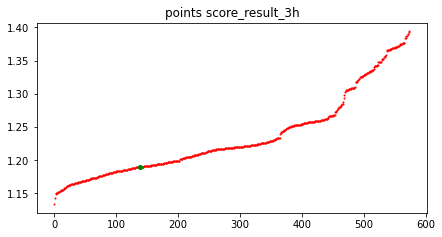

In [241]:
optimizer_3h = make_optimizer(geo_feats_batch, wrf_params_batch, not_moscow_jobs, moscow_jobs, 'score_result_3h')

current tmp index is  25


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 2.3628486	test: 2.3117221	best: 2.3117221 (0)	total: 2.24ms	remaining: 2.24s
1:	learn: 2.2953226	test: 2.2462292	best: 2.2462292 (1)	total: 4.39ms	remaining: 2.19s
2:	learn: 2.2300258	test: 2.1829755	best: 2.1829755 (2)	total: 6.97ms	remaining: 2.32s
3:	learn: 2.1683234	test: 2.1213606	best: 2.1213606 (3)	total: 9.05ms	remaining: 2.25s
4:	learn: 2.1065218	test: 2.0613682	best: 2.0613682 (4)	total: 11.3ms	remaining: 2.25s
5:	learn: 2.0470621	test: 2.0038235	best: 2.0038235 (5)	total: 13.5ms	remaining: 2.23s
6:	learn: 1.9891595	test: 1.9482060	best: 1.9482060 (6)	total: 15.8ms	remaining: 2.24s
7:	learn: 1.9336523	test: 1.8939899	best: 1.8939899 (7)	total: 93.6ms	remaining: 11.6s
8:	learn: 1.8792357	test: 1.8414289	best: 1.8414289 (8)	total: 95.9ms	remaining: 10.6s
9:	learn: 1.8263250	test: 1.7902417	best: 1.7902417 (9)	total: 98.2ms	remaining: 9.72s
10:	learn: 1.7765470	test: 1.7411422	best: 1.7411422 (10)	total: 100ms	remaining: 9.03s
11:	learn: 1.7271431	test: 1.6931725	best:

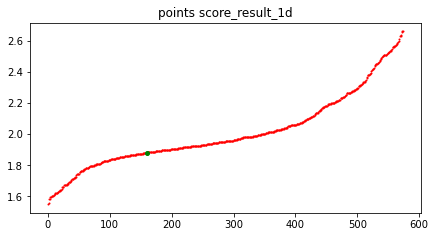

In [242]:
optimizer_1d = make_optimizer(geo_feats_batch, wrf_params_batch, not_moscow_jobs, moscow_jobs, 'score_result_1d')

current tmp index is  26


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 2.3791265	test: 2.3416584	best: 2.3416584 (0)	total: 2.42ms	remaining: 2.42s
1:	learn: 2.3117190	test: 2.2755383	best: 2.2755383 (1)	total: 4.94ms	remaining: 2.46s
2:	learn: 2.2467012	test: 2.2119915	best: 2.2119915 (2)	total: 7.27ms	remaining: 2.42s
3:	learn: 2.1832087	test: 2.1483696	best: 2.1483696 (3)	total: 9.29ms	remaining: 2.31s
4:	learn: 2.1223425	test: 2.0878950	best: 2.0878950 (4)	total: 11.3ms	remaining: 2.25s
5:	learn: 2.0631169	test: 2.0285925	best: 2.0285925 (5)	total: 13.4ms	remaining: 2.22s
6:	learn: 2.0057983	test: 1.9715763	best: 1.9715763 (6)	total: 15.4ms	remaining: 2.19s
7:	learn: 1.9499800	test: 1.9159223	best: 1.9159223 (7)	total: 17.4ms	remaining: 2.16s
8:	learn: 1.8963045	test: 1.8632110	best: 1.8632110 (8)	total: 99.8ms	remaining: 11s
9:	learn: 1.8434305	test: 1.8109108	best: 1.8109108 (9)	total: 102ms	remaining: 10.1s
10:	learn: 1.7918546	test: 1.7605316	best: 1.7605316 (10)	total: 104ms	remaining: 9.38s
11:	learn: 1.7422349	test: 1.7111392	best: 1.

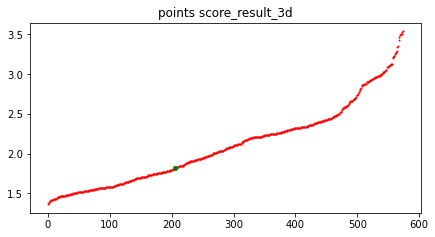

In [243]:
optimizer_3d = make_optimizer(geo_feats_batch, wrf_params_batch, not_moscow_jobs, moscow_jobs, 'score_result_3d')

current tmp index is  27


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 3.5526280	test: 3.6494767	best: 3.6494767 (0)	total: 43.5ms	remaining: 43.5s
1:	learn: 3.4588922	test: 3.5537333	best: 3.5537333 (1)	total: 45.5ms	remaining: 22.7s
2:	learn: 3.3619911	test: 3.4519105	best: 3.4519105 (2)	total: 47.7ms	remaining: 15.9s
3:	learn: 3.2650633	test: 3.3522785	best: 3.3522785 (3)	total: 50ms	remaining: 12.4s
4:	learn: 3.1704365	test: 3.2554961	best: 3.2554961 (4)	total: 52.2ms	remaining: 10.4s
5:	learn: 3.0797151	test: 3.1630617	best: 3.1630617 (5)	total: 54.4ms	remaining: 9.01s
6:	learn: 2.9916137	test: 3.0729957	best: 3.0729957 (6)	total: 56.5ms	remaining: 8.01s
7:	learn: 2.9111078	test: 2.9889266	best: 2.9889266 (7)	total: 58.8ms	remaining: 7.29s
8:	learn: 2.8271668	test: 2.9029664	best: 2.9029664 (8)	total: 142ms	remaining: 15.6s
9:	learn: 2.7467526	test: 2.8207613	best: 2.8207613 (9)	total: 144ms	remaining: 14.3s
10:	learn: 2.6677369	test: 2.7395582	best: 2.7395582 (10)	total: 147ms	remaining: 13.2s
11:	learn: 2.5922107	test: 2.6624349	best: 2.6

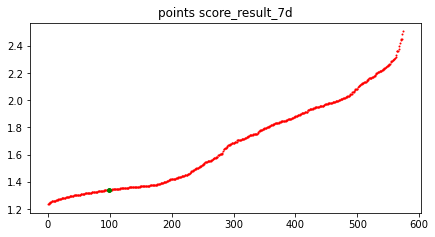

In [244]:
optimizer_7d = make_optimizer(geo_feats_batch, wrf_params_batch, not_moscow_jobs, moscow_jobs, 'score_result_7d')

In [207]:
optimizer = WrfParamsOptimizer()

current tmp index is  23


In [208]:
optimizer.fit(geo_feats_batch, wrf_params_batch, targets)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 3.1992863	test: 3.1724053	best: 3.1724053 (0)	total: 29.5ms	remaining: 29.4s
1:	learn: 3.1052240	test: 3.0781325	best: 3.0781325 (1)	total: 32.1ms	remaining: 16s
2:	learn: 3.0135256	test: 2.9876547	best: 2.9876547 (2)	total: 50.8ms	remaining: 16.9s
3:	learn: 2.9254664	test: 2.8991239	best: 2.8991239 (3)	total: 53.5ms	remaining: 13.3s
4:	learn: 2.8395124	test: 2.8146256	best: 2.8146256 (4)	total: 56ms	remaining: 11.1s
5:	learn: 2.7558799	test: 2.7312565	best: 2.7312565 (5)	total: 58.5ms	remaining: 9.69s
6:	learn: 2.6745243	test: 2.6502964	best: 2.6502964 (6)	total: 61.3ms	remaining: 8.69s
7:	learn: 2.5961190	test: 2.5722432	best: 2.5722432 (7)	total: 63.6ms	remaining: 7.89s
8:	learn: 2.5204806	test: 2.4972101	best: 2.4972101 (8)	total: 65.8ms	remaining: 7.25s
9:	learn: 2.4467318	test: 2.4235166	best: 2.4235166 (9)	total: 68.1ms	remaining: 6.75s
10:	learn: 2.3748180	test: 2.3517615	best: 2.3517615 (10)	total: 70.8ms	remaining: 6.37s
11:	learn: 2.3057134	test: 2.2828970	best: 2.

In [113]:
moscow_optimized_params = optimizer.predict(55, 38)
print(moscow_optimized_params)

Deployment created calculate-geo-feats-tmp-22. status='calculate-geo-feats-tmp-22'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.83218536]), array([2.8399205]), array([2.80870763]), array([2.81688869]), array([2.86308]), array([2.87322775]), array([2.84555009]), array([2.85614376]), array([2.82649925]), array([2.83531939]), array([2.8065

In [114]:
def make_hashable_of_params(params: dict):
    return tuple(sorted(params.items()))

def clear_non_wrf_params(params: dict):
    return {param: param_value for param, param_value in params.items() if param in [
        'MP_PHYSICS', 'RA_LW_PHYSICS', 'RA_SW_PHYSICS', 'RADT',
        'SF_SFCLAY_PHYSICS', 'SF_SURFACE_PHYSICS', 'SF_URBAN_PHYSICS',
        'BL_PBL_PHYSICS', 'CU_PHYSICS', 'DIFF_6TH_OPT','DIFF_OPT', 'KM_OPT',
    ]}

In [138]:
moscow_validation = [(clear_non_wrf_params(job["wrf_params"]), job["score_result"]["value"], job) for _, job in moscow_jobs.items()]
moscow_validation.sort(key=lambda x: x[1], reverse=False)
print(moscow_validation)

[({'MP_PHYSICS': 18, 'RA_LW_PHYSICS': 4, 'RA_SW_PHYSICS': 4, 'RADT': 6, 'SF_SFCLAY_PHYSICS': 1, 'SF_SURFACE_PHYSICS': 3, 'SF_URBAN_PHYSICS': 1, 'BL_PBL_PHYSICS': 11, 'CU_PHYSICS': 3, 'DIFF_6TH_OPT': 0, 'DIFF_OPT': 1, 'KM_OPT': 4}, 1.5485264379322468, {'id': '1448', 'kuber_job_id': 'calculate-points-1448', 'wrf_params': {'MP_PHYSICS': 18, 'RA_LW_PHYSICS': 4, 'RA_SW_PHYSICS': 4, 'RADT': 6, 'SF_SFCLAY_PHYSICS': 1, 'SF_SURFACE_PHYSICS': 3, 'SF_URBAN_PHYSICS': 1, 'BL_PBL_PHYSICS': 11, 'CU_PHYSICS': 3, 'DIFF_6TH_OPT': 0, 'DIFF_OPT': 1, 'KM_OPT': 4, 'LAT': '55.00', 'LON': '38.00', 'E_WE': 100, 'E_SN': 100, 'DX': 6000, 'TIME_STEP': 30, 'START_DATE': '2020-07-15_00:00:00', 'END_DATE': '2020-07-22_00:00:00', 'INTERVAL_SECONDS': '10800'}, 'local_dir_with_results': '/home/jovyan/work/ship/calculate_points/results/1448', 'job_dir_with_results': '/share/calculate_points/results/1448', 'score': None, 'error_msg': None, 'score_result': {'value': 1.5485264379322468, 'points_count_by_path': [0, 0, 0, 0,

186
1930
{'MP_PHYSICS': 8, 'RA_LW_PHYSICS': 4, 'RA_SW_PHYSICS': 5, 'RADT': 6, 'SF_SFCLAY_PHYSICS': 1, 'SF_SURFACE_PHYSICS': 2, 'SF_URBAN_PHYSICS': 1, 'BL_PBL_PHYSICS': 7, 'CU_PHYSICS': 3, 'DIFF_6TH_OPT': 2, 'DIFF_OPT': 1, 'KM_OPT': 4}


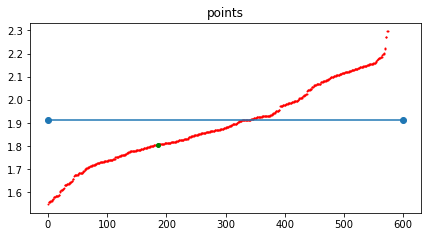

In [140]:
%matplotlib inline

plt.figure(figsize=(7, 3.5))
plt.title(f'points')

x_vals_common = []
y_vals_common = []

x_val_predict = None

for top_n, wrf_params_with_score in enumerate(moscow_validation):
    wrf_params, score, job = wrf_params_with_score
    if make_hashable_of_params(wrf_params) == make_hashable_of_params(moscow_optimized_params):
        print(top_n)
        print(job["id"])
        print(wrf_params)
        x_val_predict = top_n
    else:
        x_vals_common.append(top_n)
        y_vals_common.append(score)

plt.plot(x_vals_common, y_vals_common, 'ro', markersize=1)
plt.plot([x_val_predict], [moscow_validation[x_val_predict][1]], 'go', markersize=4)

ecmwf_val = 1.9115634618273027
plt.plot((0, 600,), (ecmwf_val, ecmwf_val,), marker = 'o')

plt.show()

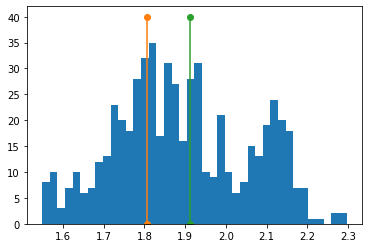

In [137]:
%matplotlib inline

#x_vals_common = []
y_vals_common = []

y_val_predict = None

for top_n, wrf_params_with_score in enumerate(moscow_validation):
    wrf_params, score = wrf_params_with_score
    if make_hashable_of_params(wrf_params) == make_hashable_of_params(moscow_optimized_params):
    #     print(top_n)
        y_val_predict = score
    # else:
        #x_vals_common.append(top_n)
    y_vals_common.append(score)

plt.hist(y_vals_common, bins=40)

#plt.plot([x_val_predict], [moscow_validation[x_val_predict][1]], 'go', markersize=4)

plt.plot((y_val_predict, y_val_predict,), (0, 40,), marker = 'o')

ecmwf_val = 1.9115634618273027
plt.plot((ecmwf_val, ecmwf_val,), (0, 40,), marker = 'o')

plt.show()

In [ ]:
plt.figure(figsize=(7, 3.5))
plt.title(f'points')

plt.plot([val for val in t["longitude"]], [val for val in t["latitude"]], 'ro', markersize=1)


plt.show()

In [329]:
optimizer.predict(55, 50)

Deployment created calculate-geo-feats-tmp-1. status='calculate-geo-feats-tmp-1'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.38178986]), array([2.38640195]), array([2.35710575]), array([2.36171783]), array([2.3614525]), array([2.36606458]), array([2.33676838]), array([2.34138047]), array([2.43118136]), array([2.43579344]), array([2.406

{'MP_PHYSICS': 17,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 3,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 11,
 'CU_PHYSICS': 3,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [330]:
optimizer.predict(55, 28)

Deployment created calculate-geo-feats-tmp-2. status='calculate-geo-feats-tmp-2'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([1.96739118]), array([1.97177837]), array([1.96410274]), array([1.96848993]), array([1.93777825]), array([1.94216544]), array([1.93448981]), array([1.938877]), array([1.9959721]), array([2.0003593]), array([1.992683

{'MP_PHYSICS': 8,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [332]:
optimizer.predict(54, 58)

Deployment created calculate-geo-feats-tmp-4. status='calculate-geo-feats-tmp-4'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([3.2167208]), array([3.22407479]), array([3.17484139]), array([3.18219537]), array([3.18614894]), array([3.19350292]), array([3.14426953]), array([3.15162351]), array([3.26283353]), array([3.27018751]), array([3.220

{'MP_PHYSICS': 8,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [334]:
optimizer.predict(60, 59)

Deployment created calculate-geo-feats-tmp-6. status='calculate-geo-feats-tmp-6'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.87119228]), array([2.87071366]), array([2.83738344]), array([2.83690482]), array([2.89381132]), array([2.8933327]), array([2.86000248]), array([2.85952385]), array([2.90954937]), array([2.90907074]), array([2.875

{'MP_PHYSICS': 8,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 3,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 2,
 'KM_OPT': 4}

In [336]:
optimizer.predict(66, 59)

Deployment created calculate-geo-feats-tmp-8. status='calculate-geo-feats-tmp-8'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([3.09883557]), array([3.10110118]), array([3.09554713]), array([3.09781274]), array([3.10700027]), array([3.10926588]), array([3.10371183]), array([3.10597744]), array([3.15284851]), array([3.15511412]), array([3.14

{'MP_PHYSICS': 18,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 5,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 3,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [337]:
optimizer.predict(53, 84)

Deployment created calculate-geo-feats-tmp-9. status='calculate-geo-feats-tmp-9'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.79836725]), array([2.8125397]), array([2.77368313]), array([2.78785558]), array([2.77089264]), array([2.78506508]), array([2.74620852]), array([2.76038096]), array([2.84954779]), array([2.86372023]), array([2.824

{'MP_PHYSICS': 8,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 3,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [338]:
optimizer.predict(53, 95)

Deployment created calculate-geo-feats-tmp-10. status='calculate-geo-feats-tmp-10'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.83079591]), array([2.83002139]), array([2.87958726]), array([2.87881274]), array([2.79169007]), array([2.79091556]), array([2.84048142]), array([2.83970691]), array([2.89348217]), array([2.89270766]), array([2.

{'MP_PHYSICS': 17,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 3,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 11,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 2,
 'KM_OPT': 4}

In [339]:
optimizer.predict(53, 112)

Deployment created calculate-geo-feats-tmp-11. status='calculate-geo-feats-tmp-11'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([3.53892113]), array([3.53821762]), array([3.59890632]), array([3.5982028]), array([3.50217095]), array([3.50146744]), array([3.56215613]), array([3.56145262]), array([3.65090761]), array([3.65020409]), array([3.7

{'MP_PHYSICS': 8,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 5,
 'SF_SURFACE_PHYSICS': 3,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 0,
 'DIFF_OPT': 2,
 'KM_OPT': 4}

In [340]:
optimizer.predict(65, 31)

Deployment created calculate-geo-feats-tmp-12. status='calculate-geo-feats-tmp-12'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.42646016]), array([2.4355419]), array([2.40177604]), array([2.41085778]), array([2.39449158]), array([2.40357332]), array([2.36980746]), array([2.3788892]), array([2.42461912]), array([2.43370086]), array([2.39

{'MP_PHYSICS': 18,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [341]:
optimizer.predict(68, 56)

Deployment created calculate-geo-feats-tmp-13. status='calculate-geo-feats-tmp-13'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([3.57273063]), array([3.57906814]), array([3.54083781]), array([3.54717531]), array([3.53362479]), array([3.5399623]), array([3.50173197]), array([3.50806948]), array([3.60875362]), array([3.61509113]), array([3.5

{'MP_PHYSICS': 18,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 5,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [342]:
optimizer.predict(68, 74)

Deployment created calculate-geo-feats-tmp-14. status='calculate-geo-feats-tmp-14'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([3.84245284]), array([3.84167832]), array([3.80143529]), array([3.80066078]), array([3.803347]), array([3.80257249]), array([3.76232945]), array([3.76155494]), array([3.73647768]), array([3.73570317]), array([3.69

{'MP_PHYSICS': 18,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 11,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 2,
 'KM_OPT': 4}

In [343]:
optimizer.predict(62, 153)

Deployment created calculate-geo-feats-tmp-15. status='calculate-geo-feats-tmp-15'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([3.59682527]), array([3.60143736]), array([3.58441211]), array([3.5890242]), array([3.56007509]), array([3.56468718]), array([3.54766193]), array([3.55227401]), array([3.62459778]), array([3.62920987]), array([3.6

{'MP_PHYSICS': 18,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 2,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 5,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [344]:
optimizer.predict(56, 159)

Deployment created calculate-geo-feats-tmp-16. status='calculate-geo-feats-tmp-16'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([2.40165818]), array([2.40117956]), array([2.38924502]), array([2.3887664]), array([2.3627151]), array([2.36223647]), array([2.35030193]), array([2.34982331]), array([2.437674]), array([2.43719538]), array([2.4252

{'MP_PHYSICS': 17,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 3,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 11,
 'CU_PHYSICS': 16,
 'DIFF_6TH_OPT': 2,
 'DIFF_OPT': 2,
 'KM_OPT': 4}

In [345]:
optimizer.predict(58, 134)

Deployment created calculate-geo-feats-tmp-17. status='calculate-geo-feats-tmp-17'
process_frame OL1 OL1
process_frame OA1 OA1
process_frame OL2 OL2
process_frame OA2 OA2
process_frame OL3 OL3
process_frame OA3 OA3
process_frame OL4 OL4
process_frame OA4 OA4
process_frame LANDMASK LANDMASK
process_frame HGT_M HGT_M
process_frame SOILTEMP SOILTEMP
process_frame SNOALB SNOALB
process_frame VAR VAR
process_frame CON CON
process_frame VAR_SSO VAR_SSO
process_frame SCT_DOM SCT_DOM
process_frame SCB_DOM SCB_DOM
0 processing
OL1 processing
OL2 processing
OL3 processing
OL4 processing
OA1 processing
OA2 processing
OA3 processing
OA4 processing
LANDMASK processing
HGT_M processing
SOILTEMP processing
SNOALB processing
VAR processing
CON processing
VAR_SSO processing
Predictions [array([4.06611352]), array([4.06837913]), array([4.13905597]), array([4.14132158]), array([4.05421493]), array([4.05648054]), array([4.12715738]), array([4.12942299]), array([4.1798962]), array([4.18216181]), array([4.2

{'MP_PHYSICS': 17,
 'RA_LW_PHYSICS': 4,
 'RA_SW_PHYSICS': 4,
 'RADT': 6,
 'SF_SFCLAY_PHYSICS': 1,
 'SF_SURFACE_PHYSICS': 3,
 'SF_URBAN_PHYSICS': 1,
 'BL_PBL_PHYSICS': 11,
 'CU_PHYSICS': 3,
 'DIFF_6TH_OPT': 0,
 'DIFF_OPT': 1,
 'KM_OPT': 4}

In [365]:
best_params_score = {}

for i in range(789):
    job = jobs_map.get(str(i), None)
    if not job:
        print(i)
        continue

    wrf_params = job["wrf_params"]
    #print(job)
    if job["score_result"]["value"] is None:
        print(i)
        continue

    lat, lon = int(wrf_params["LAT"]), int(wrf_params["LON"])
    key = (lat, lon)
    if 'points_count_by_path' in job["score_result"]:
        del job["score_result"]['points_count_by_path']

    if 'dropped_points_count_by_path' in job["score_result"]:
        del job["score_result"]['dropped_points_count_by_path']

    if 'total_used_meteostations' in job["score_result"]:
        del job["score_result"]['total_used_meteostations']

    if key == (55, 28) and wrf_params['MP_PHYSICS'] == 8 and wrf_params['CU_PHYSICS'] == 16 and wrf_params['DIFF_6TH_OPT'] == 2:
        print(wrf_params, job["score_result"]["value"])

    if key not in best_params_score:
        best_params_score[key] = job
    else:
        best_wrf_params = best_params_score[key]
        if job["score_result"]["value"] < best_wrf_params["score_result"]["value"]:
            best_params_score[key] = job

#print(best_params_score)

{'MP_PHYSICS': 8, 'RA_LW_PHYSICS': 4, 'RA_SW_PHYSICS': 5, 'RADT': 6, 'SF_SFCLAY_PHYSICS': 1, 'SF_SURFACE_PHYSICS': 3, 'SF_URBAN_PHYSICS': 1, 'BL_PBL_PHYSICS': 11, 'CU_PHYSICS': 16, 'DIFF_6TH_OPT': 2, 'DIFF_OPT': 2, 'KM_OPT': 4, 'LAT': 55.0, 'LON': 28.0, 'E_WE': 100, 'E_SN': 100, 'DX': 6000, 'TIME_STEP': 30, 'START_DATE': '2020-07-15_00:00:00', 'END_DATE': '2020-07-22_00:00:00', 'INTERVAL_SECONDS': 10800} 2.050508206495989
475
{'MP_PHYSICS': 8, 'RA_LW_PHYSICS': 4, 'RA_SW_PHYSICS': 4, 'RADT': 6, 'SF_SFCLAY_PHYSICS': 1, 'SF_SURFACE_PHYSICS': 3, 'SF_URBAN_PHYSICS': 1, 'BL_PBL_PHYSICS': 5, 'CU_PHYSICS': 16, 'DIFF_6TH_OPT': 2, 'DIFF_OPT': 1, 'KM_OPT': 4, 'LAT': 55.0, 'LON': 28.0, 'E_WE': 100, 'E_SN': 100, 'DX': 6000, 'TIME_STEP': 30, 'START_DATE': '2020-07-15_00:00:00', 'END_DATE': '2020-07-22_00:00:00', 'INTERVAL_SECONDS': 10800} 2.04234714326331
637
719
774


In [128]:
print(moscow_jobs['2056']['score_result']['total_used_meteostations'])

[[38.15, 54.833333], [39.96, 54.26], [34.4, 55.166667], [34.016667, 54.416667], [38.116667, 53.15], [37.36, 55.7], [36.03, 53.43], [35.01, 57.03], [37.261501, 55.591499], [35.35, 54.1], [37.507198, 55.5117], [40.01, 55.55], [40.966667, 56.95], [38.150002, 55.553299], [36.75, 56.35], [34.93, 56.46], [36.3, 52.316667], [35.0, 53.13], [36.7, 55.383333], [37.9063, 55.408798], [39.7, 54.633333], [37.23, 53.65], [37.616667, 55.833333], [41.26, 57.38], [36.366669, 54.549999], [42.033333, 55.6], [37.26, 52.81], [41.8, 53.45], [40.35, 56.116667], [39.25, 53.783333], [40.55, 55.13], [39.516667, 52.7], [37.63, 55.75], [39.416667, 57.2], [36.483333, 55.016667], [38.83, 56.71], [37.466667, 54.933333], [36.36, 54.13], [38.3, 57.5], [41.333333, 52.8], [39.68, 56.48], [41.4, 56.85], [40.157398, 57.560699], [35.033333, 55.516667], [34.73, 53.75], [39.5378, 52.702801], [41.766667, 54.95], [39.033333, 54.233333], [38.0, 53.56], [35.866667, 56.883333], [34.916667, 56.483333], [37.6, 52.433333], [34.55, 57